This is the Capstone Project from,
> ** Digital Vidya** for **Data Analysis using Python.**

<h1>Introduction:</h1>
<img src=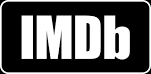>

In this project we are analyzing the *IMDb* formally known as **Internet Movie Dataset**(IMDb) is an online database of information related to films, television programs and video games, including cast, production crew, fictional characters etc.. This dataset however, contains *12,500* reviews for **Positive** and **Negetive** each in seperate text files within '*pos* & *neg*' subfolders for training and testing. It also consists numerous unlabelled folder named '*unsup*' for unsupervised learning.

The following project consists of IMdB data set where there are reviews of each movie. Here, we need to classify the reviews into positive and negative sentiments thus classifying the movies having the most good reviews. We should also try to find out the keywords in reviews which are defining the overall reviews of the movie. This will help in knowing the movies or genre of movies performing best and later on we can check out those movies. Such kind of problems are generally handled by Data Scientists working in IMDB, movie directors, movie review writers, and Bookmyshow to explore the people perspective on different movies.

Let's go.

<h2>Importing necessary modules</h2>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
%matplotlib inline
import re
import string
import glob
import pickle
import time

The data which we have to analyze is not in a proper format. For us to be able to analyze it in Python we need to insert these reviews in a Pandas DataFrame. To do that we are using libraries such as Pandas, glob. 

The glob package will help us read all the text files and Pandas will give us the proper (tabular) format which we is necessary for us to analyze.

In [2]:
#file paths of the train and test to convert it into a Dataframe.
pos_path_train = r'C:\Users\Prasad\Downloads\Compressed\aclImdb\train\pos\*.txt'
neg_path_train = r'C:\Users\Prasad\Downloads\Compressed\aclImdb\train\neg\*.txt'

pos_path_test = r'C:\Users\Prasad\Downloads\Compressed\aclImdb\test\pos\*.txt'
neg_path_test = r'C:\Users\Prasad\Downloads\Compressed\aclImdb\test\pos\*.txt'

unsup_path = r'C:\Users\Prasad\Downloads\Compressed\aclImdb\train\unsup\*.txt'

<h2>Reading the data.</h2>

In [8]:
#This function takes in the path and label to generate a dataframe.
def read_data(path, pos):
    #The globe.glob function is going to take in all the text files as stated in the above paths for train and test.
    files = glob.glob(path)
    data = pd.DataFrame()
    #The below for loop uses each file path to perform the extraction of the reviews to insert into a dataframe.
    for file in files:
        row = {'review': ''}
        with open(file, 'r', encoding = 'iso-8859-1') as f:
            content = f.read()
            row['review'] = content
        data = data.append(row, ignore_index = True)
        if pos == True:
            labels = np.ones(data.shape[0])
        elif pos != True:
            labels = np.zeros(data.shape[0])
            
    if pos == None:
        return data
        data['label'] = labels
    return data

In [4]:
pos_data = read_data(pos_path_train, True)
neg_data = read_data(neg_path_train, False)

traindf = pd.concat([pos_data,neg_data], ignore_index = True)

pos_data = read_data(pos_path_test, True)
neg_data = read_data(pos_path_test, False)

testdf = pd.concat([pos_data, neg_data], ignore_index = True)

In [9]:
def pickling(data, name):
    with open(name, 'wb') as pickle_out:
        return pickle.dump(data, pickle_out)

#train_df = pickling(traindf, 'traindf.pickle')
#test_df = pickling(testdf, 'testdf.pickle')

In [10]:
traindf = pd.read_pickle(r'C:\Users\Prasad\traindf.pickle')
testdf = pd.read_pickle(r'C:\Users\Prasad\testdf.pickle')

In [5]:
tr_index = np.arange(0, len(traindf), 1)
te_index = np.arange(len(traindf), len(traindf)*2, 1)
traindf.index = tr_index
testdf.index = te_index

np.random.seed(5)
'''For now our dataset is pretty neet our labels for the reviews are all 
in order we should be randomizing them which will help us on our Machine Learning models.''' 
traindf = traindf.iloc[np.random.permutation(len(traindf))]
testdf = testdf.iloc[np.random.permutation(len(testdf))]

In [6]:
tr_target = traindf['label']
traindf.drop('label', inplace = True, axis = 1)
te_target = testdf['label']
testdf.drop('label', inplace = True, axis = 1)

fulldf = pd.concat([traindf, testdf], ignore_index = False)

In [7]:
lens_before = traindf['review'].apply(lambda x: len(x))
te_lens_before = testdf['review'].apply(lambda x: len(x))

* <h2>Text Cleaning</h2>

Let's look at the first movie review.

In [11]:
ex = traindf['review'][1]

In [12]:
e = 'this is.A string'
r = re.compile(r'\.(?=[A-Za-z])')
re.sub(r, ' ', e)

'this is A string'

In [13]:
re.sub(r'[",;]|<.*?>', '', traindf['review'][1])

"Homelessness (or Houselessness as George Carlin stated) has been an issue for years but never a plan to help those on the street that were once considered human who did everything from going to school work or vote for the matter. Most people think of the homeless as just a lost cause while worrying about things such as racism the war on Iraq pressuring kids to succeed technology the elections inflation or worrying if they'll be next to end up on the streets.But what if you were given a bet to live on the streets for a month without the luxuries you once had from a home the entertainment sets a bathroom pictures on the wall a computer and everything you once treasure to see what it's like to be homeless? That is Goddard Bolt's lesson.Mel Brooks (who directs) who stars as Bolt plays a rich man who has everything in the world until deciding to make a bet with a sissy rival (Jeffery Tambor) to see if he can live in the streets for thirty days without the luxuries if Bolt succeeds he can d

In [14]:
#### Edited
ex = "Homelessness (or Houselessness as you're 88 George Carlin stated) has been an issue for 4 years but never a plan to help those on the street that were once considered human who did everything from going to school work or vote for the matter. Most people think of the homeless as just a lost cause while worrying about things such as racism the war on Iraq pressuring kids to succeed technology the elections inflation or worrying if they'll be next to end up on the streets.But what if you were given a bet to live on the streets for a month without the luxuries you once had from a home the entertainment sets a bathroom pictures on the wall a computer and everything you once treasure to see what it's like to be homeless? That is Goddard Bolt's lesson.Mel Brooks (who directs) who stars as Bolt plays a rich man who has everything in the world until deciding to make a bet with a sissy rival (Jeffery Tambor) to see if he can live in the streets for thirty days without the luxuries if Bolt succeeds he can do what he wants with a future project of making more buildings. The bet's on where Bolt is thrown on the street with a bracelet on his leg to monitor his every move where he can't step off the sidewalk. He's given the nickname Pepto by a vagrant after it's written on his forehead where Bolt meets other characters including a woman by the name of Molly (Lesley Ann Warren) an ex-dancer who got divorce before losing her home and her pals Sailor (Howard Morris) and Fumes (Teddy Wilson) who are already used to the streets. They're survivors. Bolt isn't. He's not used to reaching mutual agreements like he once did when being rich where it's fight or flight kill or be killed.While the love connection between Molly and Bolt wasn't necessary to plot I found Life Stinks to be one of Mel Brooks' observant films where prior to being a comedy it shows a tender side compared to his slapstick work such as Blazing Saddles Young Frankenstein or Spaceballs for the matter to show what it's like having something valuable before losing it the next day or on the other hand making a stupid bet like all rich people do when they don't know what to do with their money. Maybe they should give it to the homeless instead of using it like Monopoly money.Or maybe this film will inspire you to help others."
        ###########################            ^                                              ^
re.sub('\d+','', ex)

"Homelessness (or Houselessness as you're  George Carlin stated) has been an issue for  years but never a plan to help those on the street that were once considered human who did everything from going to school work or vote for the matter. Most people think of the homeless as just a lost cause while worrying about things such as racism the war on Iraq pressuring kids to succeed technology the elections inflation or worrying if they'll be next to end up on the streets.But what if you were given a bet to live on the streets for a month without the luxuries you once had from a home the entertainment sets a bathroom pictures on the wall a computer and everything you once treasure to see what it's like to be homeless? That is Goddard Bolt's lesson.Mel Brooks (who directs) who stars as Bolt plays a rich man who has everything in the world until deciding to make a bet with a sissy rival (Jeffery Tambor) to see if he can live in the streets for thirty days without the luxuries if Bolt succeeds

In [15]:
pattern = re.compile(r'[\",;]|<.*?>|\.(?=[A-Za-z])')
#remove_space = re.compile('\s+')
#remove_brackets = re.compile(r'\(.*?\)')
remove_brackets = re.compile(r'\(|\)')
remove_specials = re.compile('[^A-Za-z]+')
remove_numbers = re.compile('\d+')
remove_punctuations = re.compile(r'[^\w\s]')

We see there are numerous HTML tags which are not needed as they do not add any special meaning to the text. To remove these we make use of Regular Expressions module *(re)*. 

**Explaination**:

The explaination for the Regular Expression is in the order of above cell block.

**1.** The re named **`patten`** has several parts, they are seperated by **'|'**. We begin with the first one i.e. `[\",;]`, it looks for words that have the the symbols **'\'**, **'"'**, **','**, **';'** while the outer brackets **'['** and **']'** say that any character present inside those brackets will be picked in no specific order. Moving on to the next **`<.*?>`**, this one is used to detect words that starts with **'<'** and ends with **'>'**, the symbols **'.'** means every character/special character, every digit followed by **'*'** meaning zero or more characters also known as **greedy search** followed by **'?'** meaning zero or one makes it **non-greedy**. This is nicely explained in **[this link][1].** The re **\.(?=[A-Za-z])** looks for words that have '.' before a capital word e.g. this.Example, the **(?=[A-Za-z])** is a non including group and it does not include that word in our sub function.

**2.** the re named **`remove_brackets`** removes the brackets and all the contents inside it as most of the time they are used to reffer to a person.

**3.** the re named **`remove_specials`** at the start of each word indicated by **^** it only considers words as stated by **[A-Za-z]+** and neglects anything other than that.

**4.** the re named **`remove_numbers`** removes any numbers present in the string such as dates, ages and amount.

[1]:https://stackoverflow.com/a/3075532/7662387

In [16]:
re.sub(remove_punctuations, '', ex)

'Homelessness or Houselessness as youre 88 George Carlin stated has been an issue for 4 years but never a plan to help those on the street that were once considered human who did everything from going to school work or vote for the matter Most people think of the homeless as just a lost cause while worrying about things such as racism the war on Iraq pressuring kids to succeed technology the elections inflation or worrying if theyll be next to end up on the streetsBut what if you were given a bet to live on the streets for a month without the luxuries you once had from a home the entertainment sets a bathroom pictures on the wall a computer and everything you once treasure to see what its like to be homeless That is Goddard Bolts lessonMel Brooks who directs who stars as Bolt plays a rich man who has everything in the world until deciding to make a bet with a sissy rival Jeffery Tambor to see if he can live in the streets for thirty days without the luxuries if Bolt succeeds he can do 

In [17]:
#fulldf = pd.concat([traindf, testdf], ignore_index = True)

fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(r'\'re', ' are', x))
fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(r'n\'t', ' not', x))
fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(r'\'ll', ' will', x))
fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(r'\'s', ' is', x))
fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(r'\'d', ' had', x))
fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(r'\'m', ' am', x))

fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(pattern, ' ', x))
fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(remove_brackets, '', x))
fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(remove_numbers, '', x))
fulldf['review'] = fulldf['review'].apply(lambda x: re.sub('\_+', ' ', x))
fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(remove_punctuations, '', x))
fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(remove_specials, ' ', x))
#fulldf['review'] = fulldf['review'].apply(lambda x: re.sub(space, ' ', x))

In [18]:
fulldf['review'].head()

12653    Over the years Ive seen a bunch of these strai...
22745    I love B movies but come on this was not even ...
18675    I found the DVD version of this movie at a rum...
23488    I watched of this movie and wondered why it go...
5580     Bill and Ted are back only this time an evil d...
Name: review, dtype: object

* <h2>Stemming and Lemmatization</h2>

In [12]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer, WordNetLemmatizer, PorterStemmer
from nltk import FreqDist
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer

In [13]:
my_stopwords = ['one','first', 'two', 'second', 'three', 'third', 'four', 'fourth', 'five', 'fifth', 'six', 'sixth', 'seven', 'seventh',
'eigth', 'eighth', 'nine', 'nineth' ,'ten', 'tenth', 'time', 'name', 'use', 'like', 'say', 'etc', 'dog', 'cat', 'could',
'watch', 'know', 'iraq', 'china', 'india', 'russia', 'us', 'australia', 'korea', 'england', 'italy', 'london','irish', 'show', 
'see', 'well', 'also', 'jess', 'steve', 'amanda', 'ãmigrã', 'âthe', 'â½', 'ãme', 'zuniga', 'zulu' , 'zucker', 'zorro', 'zooland',
'br','id', 'ethan', 'brad', 'kapoor', 'joe', 'jennifer', 'julia', 'korean', 'korea', 'robert', 'ryan', 'walters', 'tom', 'scott']

In [14]:
filter_words = set(stopwords.words('english'))
#my_stopword_list = list(string.punctuation)
#more_stopwords = ['\'re', '\'ve', 'n\'t', '\'s']
#for w in more_stopwords:
#    my_stopword_list.append(w)
stem = 'snow'
filter_words = set(filter_words.union(my_stopwords))
if stem == 'snow':
    stemmer = SnowballStemmer(language = 'english', ignore_stopwords = True,)
if stem == 'porter':
    stemmer = PorterStemmer()
    
#lemmatize
lemma = WordNetLemmatizer()

In [22]:
## Removes stopwords from the documents by searching through it using predefined and manually added words from the texts.
def filtering(text):
    words = 0
    words = []
    for word in text.split():
        if word not in filter_words:
            words.append(word)       
    #words = ' '.join([word.lower() for word in text.split() if word not in filter_words])
    return ' '.join(words)

start = time.time()

fulldf['review'] = fulldf['review'].apply(lambda x: filtering(x.lower()))
end = time.time()
print(end - start)

3.973684310913086


In [23]:
fulldf['review'][1]

'homelessness houselessness george carlin stated issue years never plan help street considered human everything going school work vote matter people think homeless lost cause worrying things racism war pressuring kids succeed technology elections inflation worrying next end streets given bet live streets month without luxuries home entertainment sets bathroom pictures wall computer everything treasure homeless goddard bolt lesson mel brooks directs stars bolt plays rich man everything world deciding make bet sissy rival jeffery tambor live streets thirty days without luxuries bolt succeeds wants future project making buildings bet bolt thrown street bracelet leg monitor every move ca step sidewalk given nickname pepto vagrant written forehead bolt meets characters including woman molly lesley ann warren exdancer got divorce losing home pals sailor howard morris fumes teddy wilson already used streets survivors bolt used reaching mutual agreements rich fight flight kill killed love conn

In [24]:
traindf = fulldf.iloc[:len(traindf),:]
testdf = fulldf.iloc[len(traindf):,:]

In [25]:
traindf['review'][1]

'homelessness houselessness george carlin stated issue years never plan help street considered human everything going school work vote matter people think homeless lost cause worrying things racism war pressuring kids succeed technology elections inflation worrying next end streets given bet live streets month without luxuries home entertainment sets bathroom pictures wall computer everything treasure homeless goddard bolt lesson mel brooks directs stars bolt plays rich man everything world deciding make bet sissy rival jeffery tambor live streets thirty days without luxuries bolt succeeds wants future project making buildings bet bolt thrown street bracelet leg monitor every move ca step sidewalk given nickname pepto vagrant written forehead bolt meets characters including woman molly lesley ann warren exdancer got divorce losing home pals sailor howard morris fumes teddy wilson already used streets survivors bolt used reaching mutual agreements rich fight flight kill killed love conn

In [26]:
for word in word_tokenize(traindf['review'][1]):
    print(''.join(stemmer.stem(word)), end = ' ', sep = '')

homeless houseless georg carlin state issu year never plan help street consid human everyth go school work vote matter peopl think homeless lost caus worri thing racism war pressur kid succeed technolog elect inflat worri next end street given bet live street month without luxuri home entertain set bathroom pictur wall comput everyth treasur homeless goddard bolt lesson mel brook direct star bolt play rich man everyth world decid make bet sissi rival jefferi tambor live street thirti day without luxuri bolt succeed want futur project make build bet bolt thrown street bracelet leg monitor everi move ca step sidewalk given nicknam pepto vagrant written forehead bolt meet charact includ woman molli lesley ann warren exdanc got divorc lose home pal sailor howard morri fume teddi wilson alreadi use street survivor bolt use reach mutual agreement rich fight flight kill kill love connect molli bolt necessari plot found life stink mel brook observ film prior comedi show tender side compar slap

In [27]:
for word in word_tokenize(traindf['review'][1]):
    print(''.join(lemma.lemmatize(word)), end = ' ')

homelessness houselessness george carlin stated issue year never plan help street considered human everything going school work vote matter people think homeless lost cause worrying thing racism war pressuring kid succeed technology election inflation worrying next end street given bet live street month without luxury home entertainment set bathroom picture wall computer everything treasure homeless goddard bolt lesson mel brook directs star bolt play rich man everything world deciding make bet sissy rival jeffery tambor live street thirty day without luxury bolt succeeds want future project making building bet bolt thrown street bracelet leg monitor every move ca step sidewalk given nickname pepto vagrant written forehead bolt meet character including woman molly lesley ann warren exdancer got divorce losing home pal sailor howard morris fume teddy wilson already used street survivor bolt used reaching mutual agreement rich fight flight kill killed love connection molly bolt necessary

In [28]:
def StemmOrLemm(text):
    words = 0
    words = ''
    value = 'stemm'
    if value == 'stemm':
        words = ' '.join([stemmer.stem(word) for word in word_tokenize(text)])
    
    if value == 'lemm':
        words = ' '.join([lemma.lemmatize(word) for word in word_tokenize(text)])
    return words

In [29]:
start = time.time()
traindf = traindf.loc[:,'review'].apply(lambda x: StemmOrLemm(x))
testdf = testdf.loc[:,'review'].apply(lambda x: StemmOrLemm(x))
end = time.time()
print(f'time taken: {np.round((end - start)/60)} mins')

time taken: 4.0 mins


In [30]:
#tra_target = pickling(tr_target, 'tr_target.pickle')
#tes_target = pickling(te_target, 'te_target.pickle')

In [31]:
#clean_traindf_s = pickling(traindf, 'clean_traindf_Ss.pickle')
#clean_testdf_s = pickling(testdf, 'clean_testdf_Ss.pickle')

<h2>Cleaning is done!</h2>

In [9]:
traindf = pd.read_pickle(r'C:\Users\Prasad\clean_traindf_Ss.pickle')
tr_target = pd.read_pickle(r'C:\Users\Prasad\tr_target.pickle')
testdf = pd.read_pickle(r'C:\Users\Prasad\clean_testdf_Ss.pickle')
te_target = pd.read_pickle(r'C:\Users\Prasad\te_target.pickle')

In [10]:
pos = []
neg = []
for index, (label, review) in enumerate(zip(tr_target, traindf)):
    if label == 1:
        pos.append(review)
    if label != 1:
        neg.append(review)
pos = pd.Series(pos)
neg = pd.Series(neg)

In [34]:
def freq(text):
    all_text = text.str.cat(sep = ' ')
    words = word_tokenize(all_text)
    dist = FreqDist(word for word in words if word not in filter_words)
    return dist
Pos_words = freq(pos)
Neg_words = freq(neg)

In [35]:
#pos high
ph = (dict(Pos_words.most_common(20)))
#neg high
nh = (dict(Neg_words.most_common(20)))

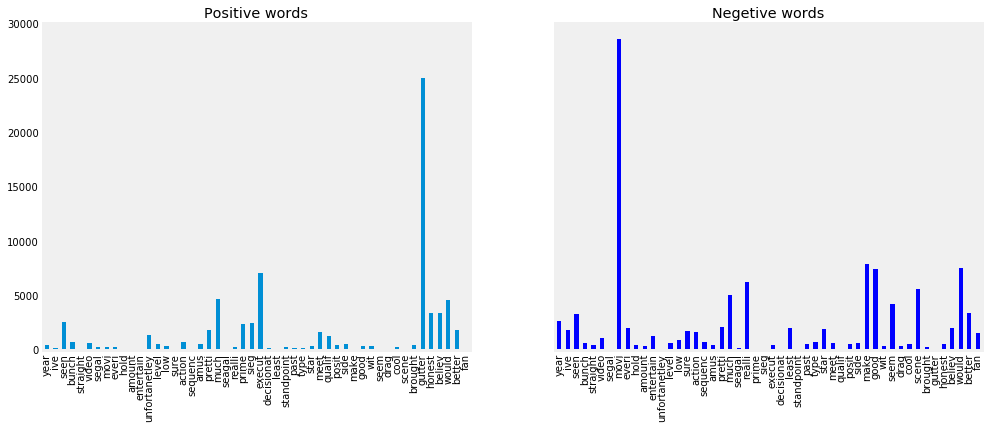

In [36]:
Pos_ = pd.Series(list(Pos_words.values()), list(Pos_words.keys()))
Neg_ = pd.Series(list(Neg_words.values()), list(Neg_words.keys()))

f, ax = plt.subplots(1,2,figsize = [15,6], sharey = True, sharex = True)
#plt.setp(ax.get_xticklabels(), rotation='vertical', fontsize=14)
Pos_[:50].plot(kind = 'bar', ax = ax[0])
ax[0].set_title('Positive words')
ax[0].grid(False)
#ax[0].axhline(y = 20000, xmin = 0, xmax = 1, color = 'blue')

Neg_[:50].plot(kind = 'bar', ax = ax[1], color = 'blue')
ax[1].set_title('Negetive words')
ax[1].grid(False)
#ax[1].axhline(y = 20000, xmin = 0, xmax = 1)

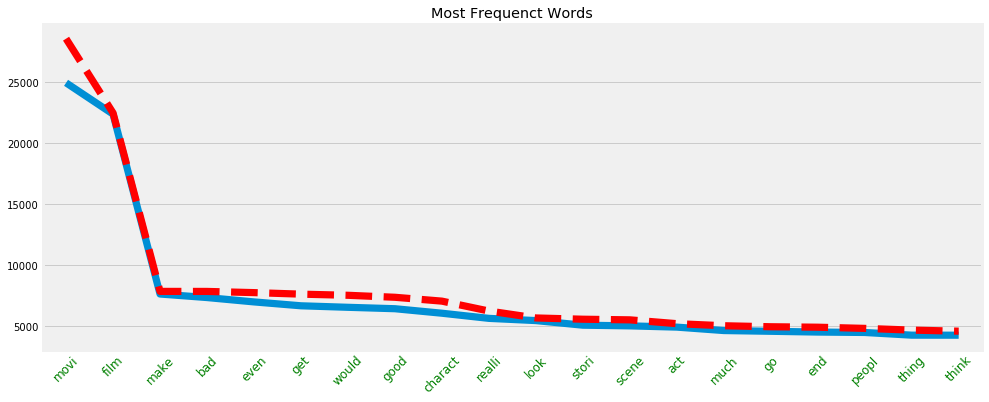

In [37]:
plt.figure(figsize = [15,6])
sns.pointplot(x = list(ph.keys()), y = list(ph.values()), markers = 'None', label = 'Positive', legend = True)
sns.pointplot(x = list(nh.keys()), y = list(nh.values()), markers = 'None', linestyles = '--', color = 'r', label = 'Negetive', legend = True)

plt.xticks(rotation = '45')
plt.title('Most Frequenct Words')
plt.tick_params(axis = 'x', labelsize = 'large', labelcolor = 'green')

we can notice that the word "movie" and "film" were very frequently used making it the highest 2 words from the entire data. 

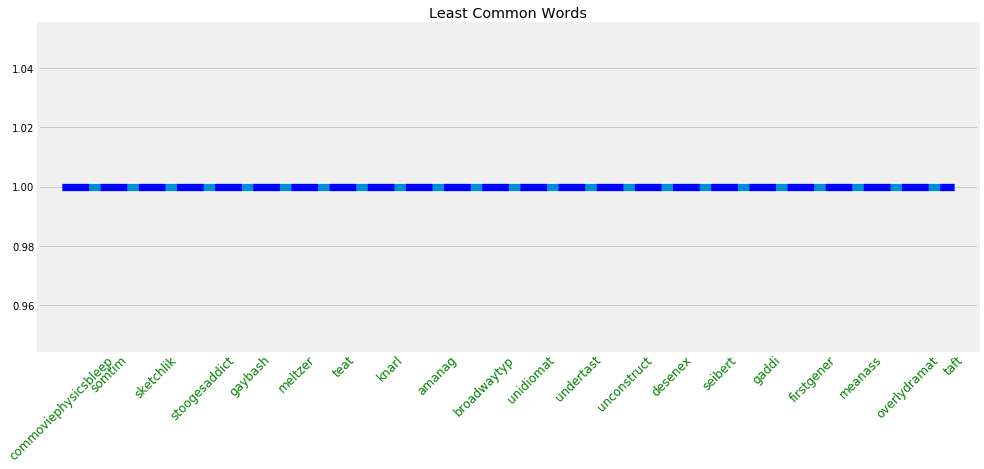

In [38]:
pl = dict(Pos_words.most_common()[-20:])
nl = dict(Neg_words.most_common()[-20:])
plt.figure(figsize = [15,6])
sns.pointplot(x = list(pl.keys()), y = list(pl.values()), markers = 'None',)
sns.pointplot(x = list(nl.keys()), y = list(nl.values()), markers = 'None', linestyles = '--', color = 'b')
plt.xticks(rotation = '45')
plt.title('Least Common Words')
plt.tick_params(axis = 'x', labelsize = 'large', labelcolor = 'green')

(array([  1.74440000e+04,   5.17800000e+03,   1.56000000e+03,
          5.66000000e+02,   2.20000000e+02,   2.20000000e+01,
          2.00000000e+00,   2.00000000e+00,   2.00000000e+00,
          4.00000000e+00]),
 array([   31. ,   736.7,  1442.4,  2148.1,  2853.8,  3559.5,  4265.2,
         4970.9,  5676.6,  6382.3,  7088. ]),
 <a list of 10 Patch objects>)

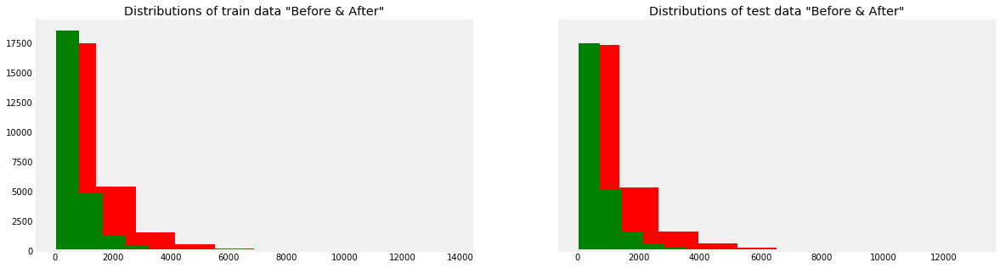

In [39]:
lens_after = traindf.apply(lambda x: len(x))
te_lens_after = testdf.apply(lambda x: len(x))
f, ax = plt.subplots(nrows = 1, ncols = 2, figsize = [18,5], sharey = True)
ax[0].hist(lens_before, color = 'r')
ax[0].set_title('Distributions of train data "Before & After"')
ax[0].hist(lens_after, color = 'g')
ax[0].grid('off')
ax[1].hist(te_lens_before, color = 'r')
ax[1].grid('off')
ax[1].set_title('Distributions of test data "Before & After"')
ax[1].hist(te_lens_after, color = 'g')

* <h2>Word Clouds</h2>

(-0.5, 399.5, 199.5, -0.5)

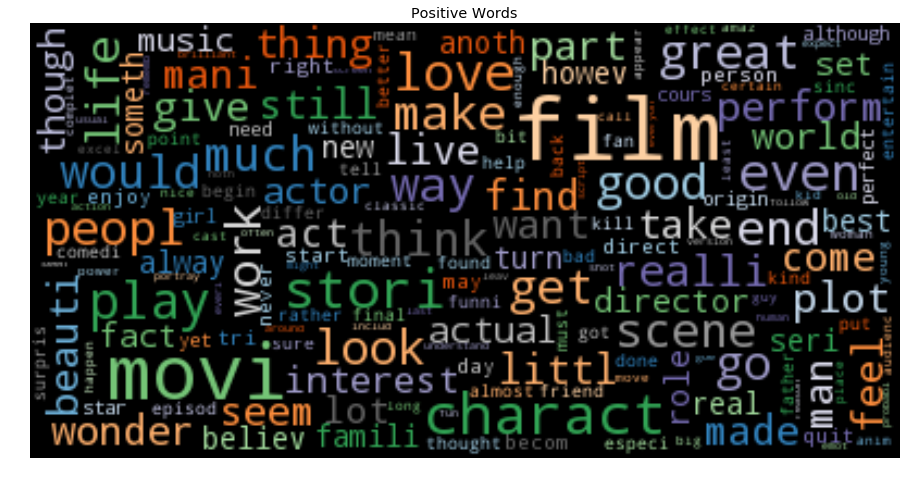

In [15]:
from wordcloud import WordCloud
plt.figure(figsize = [18,8])
plt.title('Positive Words')
wc = WordCloud(stopwords = filter_words, random_state = 7, max_words = 10000, max_font_size = 40, 
               background_color = 'black')
wc.generate(''.join(pos))
plt.imshow(wc.recolor(colormap = 'tab20c' , random_state = 16), alpha = 1, interpolation = 'bilinear')
plt.axis('off')

(-0.5, 399.5, 199.5, -0.5)

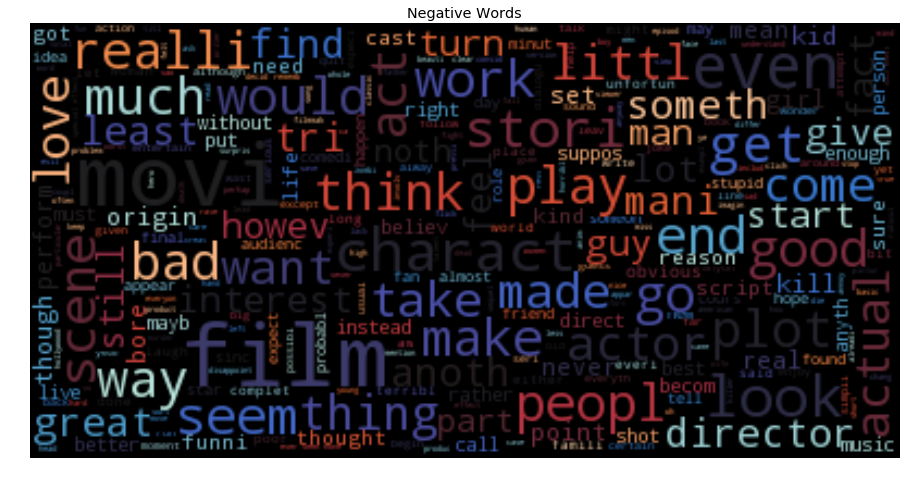

In [41]:
plt.figure(figsize = [18,8])
wc.generate(''.join(neg))
plt.title('Negative Words')
plt.imshow(wc.recolor(colormap = 'icefire', random_state = 16), alpha = 1, interpolation = 'bilinear')
plt.axis('off')

* <h2>Vectorizing the data</h2>

In [42]:
###Models####
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import MultinomialNB
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.decomposition import TruncatedSVD
#######
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split, KFold
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif, SelectPercentile
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.base import clone, BaseEstimator

C:\Users\Prasad\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [43]:
X_train, X_test, y_train, y_test = train_test_split(traindf, tr_target, test_size = 0.3, random_state = 7)

In [44]:
print(f'X_train: {X_train.shape}\nX_test: {X_test.shape}\ny_train: {y_train.shape}\ny_test: {y_test.shape}')

X_train: (17500,)
X_test: (7500,)
y_train: (17500,)
y_test: (7500,)


In [45]:
vect_params = {'stop_words': filter_words, 'ngram_range': (1,2), 'encoding': 'iso08859-1'}

vect = 'count'

if vect == 'count':
    vect = CountVectorizer(vect_params)
    X_train_vect = vect.fit_transform(X_train)
    X_test_vect = vect.transform(X_test)
else:
    vect = TfidfVectorizer(vect_params)
    X_train_vect = vect.fit_transform(X_train)
    X_test_vect = vect.transform(X_test)

#X_train_Cvect = countVect.fit_transform(traindf)
#X_test_Cvect = countVect.transform(testdf)
print('The matrix created from Vectorizer has shape of: {} {} respectively.'.format(X_train_vect.shape, X_test_vect.shape))

The matrix created from Vectorizer has shape of: (17500, 57978) (7500, 57978) respectively.


* * <h2>Clustering:</h2>

In [46]:
clusters = 2
vect_params = {
    'max_df': 1,
    'min_df': 1,
    'encoding': 'iso-8859-1',
    'stop_words': filter_words
}

tfidf_params = {
    'norm': 'l2',
    'sublinear_tf': False
}


kmeans_params = {
    'n_clusters': clusters,
    'random_state':  7,
}

svd_params = {
    'n_components': clusters, 
    'random_state': 7
}

pipeline = make_pipeline(CountVectorizer(**vect_params), TfidfTransformer(**tfidf_params), TruncatedSVD(**svd_params))

vect = pipeline.fit_transform(traindf)
model = MiniBatchKMeans(**kmeans_params)
model.fit(vect)

MiniBatchKMeans(batch_size=100, compute_labels=True, init='k-means++',
        init_size=None, max_iter=100, max_no_improvement=10, n_clusters=2,
        n_init=3, random_state=7, reassignment_ratio=0.01, tol=0.0,
        verbose=0)

In [47]:
centers = model.cluster_centers_
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
labels = model.labels_
terms = pipeline.named_steps.countvectorizer.get_feature_names()

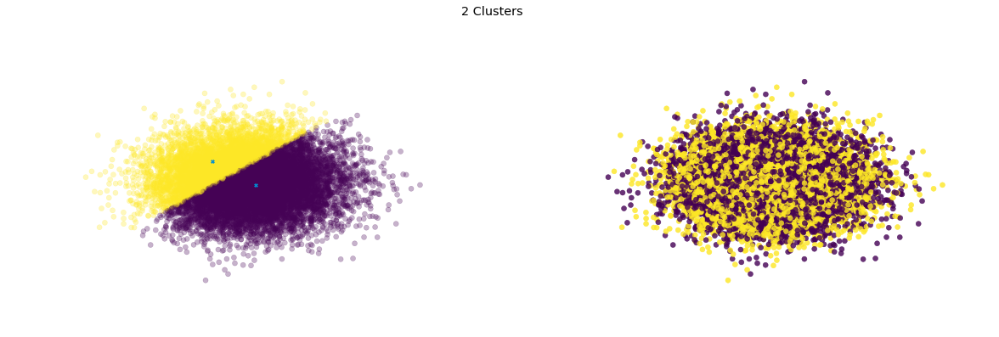

In [48]:
f, ax = plt.subplots(1,2, figsize = [18,6])
ax[0].scatter(x = vect[:,0], y = vect[:,1], c = labels, alpha = 0.3)
ax[0].scatter(x = centers[:,0], y = centers[:,1], marker = 'X', s = 16)
ax[0].grid('off'); ax[0].axis('off')

ax[1].grid('off'); ax[1].axis('off')
ax[1].scatter(x = vect[:,0], y = vect[:,1], c = tr_target, alpha = 0.8)

plt.title('2 Clusters', y = 1.08, x = -0.15)

Here we see on the left side of the graph that, the clusters created from kmeans are marginally seperate which are predicted by KMeans algorithm. The graph on right side indicates the true labels from the data.

In [49]:
import plotly.offline as py
py.init_notebook_mode(connected = False)
import plotly.graph_objs as go

pipeline = make_pipeline(CountVectorizer(**vect_params), TfidfTransformer(**tfidf_params), TruncatedSVD(n_components = 3, random_state = 7))
vect1 = pipeline.fit_transform(traindf)
model = MiniBatchKMeans(n_clusters = 3)
model.fit(vect1)
c3nters = model.cluster_centers_
labels_ = model.labels_
x = vect1[:,0]
y = vect1[:,1]
z = vect1[:,2]

trace1 = go.Scatter3d(
        x = x,
        y = y,
        z = z,
    mode = 'markers',
    name = 'Data',
    marker = dict(
        size = 7,
        color = labels.astype(np.float),
        colorscale = 'YlOrBr',
        line = dict(
            color = 'rgba(217, 217, 217, 0.14)',
            width = 0.5
        ),
        
        opacity = 0.5
    )
)

trace2 = go.Scatter3d(
        x = c3nters[:,0],
        y = c3nters[:,1],
        z = c3nters[:,2],
    mode = 'markers',
    name = 'Cluster Centers',
    showlegend = True,
    marker = dict(
        color = 'rgb(127, 127, 127)',
        size = 20,
        symbol = 'square',
        line = dict(
            color = 'rgb(204, 204, 204)',
            width = 1
        ),
        opacity = 1.5
    )
)

layout = go.Layout(
    title = '3 Clusters',
    margin = dict(
        l = 0,
        r = 0,
        b = 0,
        t = 0
    )
)

data = [trace1, trace2]

fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

Here we can see that the clusters produced are overlapping everywhere which makes the job of classification difficult.  * Zoom in to see the clusters centers. The data points can be made hidden by clicking on the legend.*

<h2>Unsupervised Learning:</h2>

In [50]:
unsupdf = read_data(unsup_path, None)

In [51]:
unsupdf.head()

,review
0,"I admit, the great majority of films released ..."
1,"Take a low budget, inexperienced actors doubli..."
2,"Everybody has seen 'Back To The Future,' right..."
3,Doris Day was an icon of beauty in singing and...
4,"After a series of silly, fun-loving movies, 19..."


In [52]:
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(r'\'re', ' are', x))
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(r'n\'t', ' not', x))
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(r'\'ll', ' will', x))
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(r'\'s', ' is', x))
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(r'\'d', ' had', x))
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(r'\'m', ' am', x))

unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(pattern, ' ', x))
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(remove_brackets, '', x))
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(remove_numbers, '', x))
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub('\_+', ' ', x))
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(remove_punctuations, '', x))
unsupdf['review'] = unsupdf['review'].apply(lambda x: re.sub(remove_specials, ' ', x))

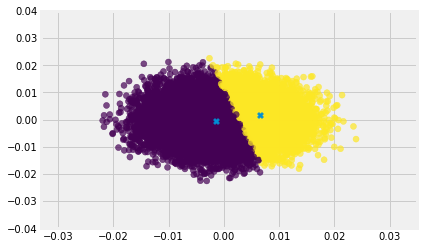

In [53]:
pipeline = make_pipeline(CountVectorizer(**vect_params), TfidfTransformer(**tfidf_params), TruncatedSVD(n_components = 2, random_state = 7))
unvect = pipeline.fit_transform(unsupdf['review'])
model = MiniBatchKMeans(n_clusters = 2, random_state = 7)
model.fit(unvect)

plt.scatter(x = unvect[:,0], y = unvect[:,1], c = model.labels_, alpha = 0.7)
plt.scatter(x = model.cluster_centers_[:,0], y = model.cluster_centers_[:,1], marker = 'X')

* <h2>Machine Learning:</h2>

* * <h3>Pipeline:</h3>

Pipelines are great for code re-usability. They are used create well as the name suggests, a Pipeline. The cell below depicts how a pipeline is created. it takes a list and within a list is a tuple with first being the function's name which are being used. These names are used to set the parameter's of the respective model you are using through the pipeline.


* * <h3>GridSearch:</h3>

The use of Grid Search allows us to perform Hyper-parameter tuning with ease and works very well with Pipelines. The idea of the Grid Search is, it takes dictionary as its parameters for the models inside and it has the ability to output the best parameters along with other benefits.

In [54]:
pipeline1 = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('selector', SelectPercentile()),
    ('clf', MultinomialNB()),
    ])

grid_params = {
    'vect__stop_words': [filter_words],
    #0.5, 0.45
    'vect__max_df': [0.3,0.7],
    'vect__min_df': [5],
    #(1,2),(1,3),(1,3)
    'vect__ngram_range': [(1,3)],
    #'vect__binary': [True],
    'vect__encoding': ['iso-8859-1'],
    #l2,l2,l2
    'tfidf__norm': ['l2'],
    'tfidf__sublinear_tf': [True],
    'tfidf__use_idf': [True],
    #70,80,85
    'selector__percentile': [90],
    'selector__score_func': [chi2],
    #0.1,0.15, 0.5, 0.7,0.8, 1.2
    'clf__alpha': [1.2],
    
}

start = time.time()
grid = GridSearchCV(pipeline1, grid_params, scoring = 'accuracy', cv = 3, n_jobs = -1)
grid.fit(X_train, y_train)

best_params_nb = grid.best_params_
end = time.time()
print(f'time taken: {np.round((end - start)/60)} min(s)')
print(f'The best score from the model is: {grid.best_score_}')

time taken: 2.0 min(s)
The best score from the model is: 0.8700571428571429


In [55]:
pipeline1 = pipeline1.set_params(**best_params_nb)
#pipeline1.get_params()
pipeline1.fit(X_train, y_train)
preds = pipeline1.predict(X_test)
accuracy_score(y_test, preds)

0.86973333333333336

In [56]:
pipeline1.fit(traindf, tr_target)
preds = pipeline1.predict(testdf)
accuracy_score(te_target, preds)

0.5

In [57]:
pipeline2 = Pipeline([
    ('vect', CountVectorizer(encoding = 'iso-8859-1')),
    ('tfidf', TfidfTransformer()),
    ('selector', SelectPercentile()),
    ('clf', SGDClassifier())
])
params = {
    'vect__stop_words': [filter_words],
    'vect__ngram_range': [(1,3)],
    'vect__max_df': [0.2],
    'vect__min_df': [0.1],
    
    'tfidf__norm': ['l1'],
    'tfidf__sublinear_tf': [True],
    
    'selector__percentile': [90],
    'selector__score_func': [chi2],
    
    'clf__loss': ['log'],
    'clf__penalty': ['l2'],
    'clf__alpha': [0.00005],
    'clf__random_state': [7],
    'clf__tol': [1e-3],
    #'clf__warm_start': [True]
}
start = time.time()
grid = GridSearchCV(pipeline2, param_grid = params, scoring = 'accuracy', cv = 3, n_jobs = -1,)
grid.fit(X_train, y_train)
best_params_sgd = grid.best_params_
end = time.time()
print(f'time taken: {np.round((end - start)/60)} min')
print('{:.4f}'.format(grid.best_score_))

time taken: 2.0 min
0.7005


In [58]:
pipeline2 = pipeline2.set_params(**best_params_sgd)
pipeline2.fit(X_train, y_train)
preds = pipeline2.predict(X_test)
accuracy_score(y_test, preds)

0.70053333333333334

In [59]:
pipeline2.fit(traindf, tr_target)
preds = pipeline2.predict(testdf)
accuracy_score(te_target, preds)

0.5

In [60]:
pipeline3 = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('selector', SelectPercentile()),
    ('clf', RandomForestClassifier())
])

grid_params = {
    'vect__stop_words': [filter_words],
    'vect__ngram_range': [(1,3)],
    'vect__encoding': ['iso-8859-1'],
    'vect__max_df': [0.3],
    'vect__min_df': [0.1],
    
    'tfidf__norm': ['l1'],
    'tfidf__sublinear_tf': [True],
    
    'selector__score_func': [chi2],
    'selector__percentile': [90],
    
    'clf__n_estimators': [15],
    'clf__max_depth': [20],
    'clf__random_state': [7]
}
start = time.time()
grid = GridSearchCV(pipeline3, grid_params, scoring = 'accuracy', cv = 3, n_jobs = -1)
grid.fit(X_train, y_train)
best_params_rf = grid.best_params_
print(f'{grid.best_score_}')
end = time.time()
print(f'time taken: {np.round(end - start)/60} mins')

0.7107428571428571
time taken: 1.6666666666666667 mins


In [61]:
pipeline3 = pipeline3.set_params(**best_params_rf)
pipeline3.fit(X_train, y_train)
preds = pipeline3.predict(X_test)
accuracy_score(y_test, preds)

0.71040000000000003

In [62]:
pipeline3.fit(traindf, tr_target)
preds = pipeline3.predict(testdf)
accuracy_score(te_target, preds)

0.5

In [63]:
eclf = VotingClassifier([
    ('p1', pipeline1),
    ('p2', pipeline2),
    ('p3', pipeline3)
], voting = 'soft', weights = [0.5, 0.3, 0.2])

start = time.time()
eclf.fit(X_train, y_train)
preds = eclf.predict(X_test)
score = accuracy_score(y_test, preds)
end = time.time()
print(f'accuracy: {score}\ntime taken: {np.round((end - start)/60)}')

accuracy: 0.8482666666666666
time taken: 2.0


In [64]:
eclf.fit(traindf, tr_target)
preds = eclf.predict(testdf)
accuracy_score(te_target, preds)

0.5

All these models perform well on validation set but whenever applied on actual test data the accuracy is always 50%. we shall investigate this but before that we try another approach in building the model to see if anything changes.

* * <h3>Building a stacking model:</h3>

Stacking model as the name suggests, it stacks!

**Explaination**:

The idea behind stacking model is, There are two seperate models, 

**1.** **BaseModels** and 

**2.** **MetaModel**. 

The **BaseModels** consists of several models which training on the training data. The predictions from these **BaseModels** however are used onto the **MetaModel**. So in other words, **BaseModels** train on the sparse matrix while the **MetaModels** train on the predictions of the **BaseModels**.

The code below takes in 4 models as **BaseModels** namely "MultinomialNB", "SGDClassifer", "RandomForestClassifer" and lastly "VotingClassifer" which is the combination of the 3 models mentioned before. The **MetaModel** used is, "XGBClassifier". When the fit method is called all the models are cloned which means in every iteration the of the **BaseModels** a new model is put to training which can be altered using number of splits we do on the training data. In our case we have 3 instances of our 4 base models **each**.

In [65]:
from sklearn.base import clone, BaseEstimator, ClassifierMixin

class Stacking(BaseEstimator, ClassifierMixin):
    
    def __init__(self, BaseModels, MetaModel, nfolds = 2, seed = 1):
        self.BaseModels = BaseModels
        self.MetaModel = MetaModel
        self.nfolds = nfolds
        self.seed = np.random.seed(seed)
    
    def fit(self, X, y):
        out_of_fold_preds = np.zeros(shape = (X.shape[0], len(self.BaseModels)))
        kfolds = KFold(n_splits = self.nfolds, shuffle = True, random_state = 7)
        self.BaseModels_ = [list() for model in self.BaseModels]
        self.MetaModel_ = clone(self.MetaModel)
        
        for index, model in enumerate(self.BaseModels):
            for train_index, out_of_fold_index in kfolds.split(X, y):
                instance = clone(model)
                self.BaseModels_[index].append(instance)
                instance.fit(X[train_index], y[train_index])
                preds = instance.predict(X[out_of_fold_index])
                out_of_fold_preds[out_of_fold_index, index] = preds
                
        self.MetaModel_.fit(out_of_fold_preds, y)
        
        return self

    
    def predict(self, X):
        meta_features = np.zeros(shape = (X.shape[0], len(self.BaseModels_)))
        
        for col_index, BaseModel in enumerate(self.BaseModels_):
            meta_preds = np.zeros(shape = (X.shape[0], len(self.BaseModels_)))
            
            for index, model in enumerate(BaseModel):
                col = model.predict(X)
                meta_preds[:,index] = col
            
            meta_preds = np.mean(meta_preds, axis = 1)
            meta_features[:,col_index] = meta_preds
        
        return self.MetaModel_.predict(meta_features)
        
xgb = XGBClassifier()
stack = Stacking(BaseModels = [pipeline1, pipeline2, pipeline3, eclf], MetaModel = xgb, nfolds = 3, seed = 4)
stack.fit(X_train.values, y_train.values)

Stacking(BaseModels=[Pipeline(memory=None,
     steps=[('vect', CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='iso-8859-1',
        input='content', lowercase=True, max_df=0.3, max_features=None,
        min_df=5, ngram_range=(1, 3), prepr...))]))],
         flatten_transform=None, n_jobs=1, voting='soft',
         weights=[0.5, 0.3, 0.2])],
     MetaModel=XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=100, nthread=-1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1),
     nfolds=3, seed=None)

In [66]:
stack.score(X_test, y_test)

0.86880000000000002

In [67]:
preds = stack.predict(testdf.values)
accuracy_score(te_target, preds)

0.5

In [68]:
incorrects = testdf.loc[np.where(te_target != preds, te_target.index, 0)].dropna()
incorrects = incorrects.reset_index(drop = True)

In [69]:
dist = FreqDist(word_tokenize(incorrects.str.cat(sep = ' ')))
te_text = [word for word in dist.keys() if word not in filter_words]

In [70]:
dist = dict(dist)
te_feat = pd.DataFrame([dist.keys(), dist.values()]).T

In [71]:
te_feat = te_feat.rename(columns = {0: 'features', 1: 'counts'}).sort_values(by = 'counts', ascending = False)

In [74]:
#pickling(te_feat, 'te_feat.pickle')

In [2]:
te_feat = pd.read_pickle(r'C:\Users\Prasad\te_feat.pickle')

In [7]:
words = ' '.join(te_feat['features'])

In [3]:
import codecs
from wordcloud import STOPWORDS
import base64
import requests
from scipy.misc import imread

C:\Users\Prasad\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


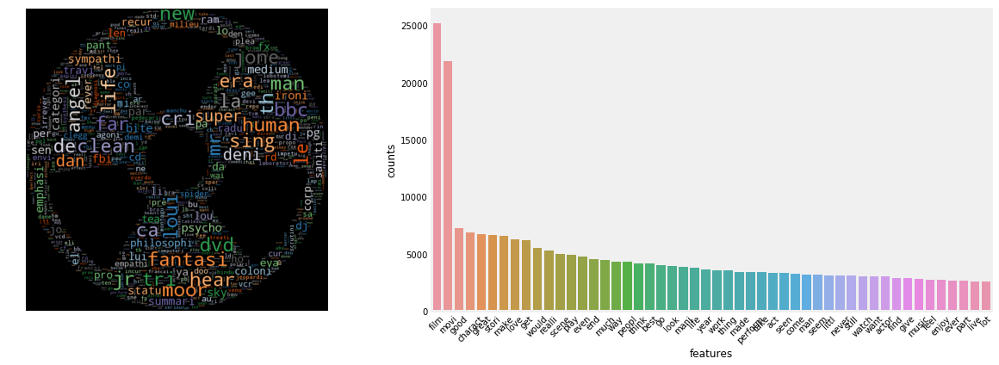

In [8]:
Stopwords = set(STOPWORDS)
img = base64.b64encode(requests.get('https://image.freepik.com/free-icon/toxic-material-symbol_318-37309.jpg').content)

f1 = open('incorrects.jpg', 'wb')
f1.write(codecs.decode(img, 'base64'))
f1.close()

Img = imread('incorrects.jpg')

wc = WordCloud(background_color = 'black', max_words = 1000, 
               mask = Img, stopwords = Stopwords, max_font_size = 40)

f, ax = plt.subplots(1,2, figsize = [18,6])
wc.generate(words)
ax[0].imshow(wc.recolor(colormap = 'tab20c' , random_state = 16), alpha = 1, interpolation = 'bilinear')
ax[0].grid('off'); ax[0].axis('off')

sns.barplot(x = 'features', y = 'counts', data = te_feat[:50], ax = ax[1])
plt.xticks(rotation = 45)
ax[1].grid('off')

plt.tight_layout()

In [77]:
least_words = te_feat.loc[te_feat['counts'] == 1, 'features']
print(f'There are about {len(least_words)} least words that are not present in the training set which could be the reason our model is not able to predict very well. Here are a few of them,\n{least_words[:5]}')

There are about 21751 least words that are not present in the training set which could be the reason our model is not able to predict very well. Here are a few of them,
36127      branaugh
34321           gwr
36213    takenforgr
34779         whlie
38251      morissey
Name: features, dtype: object


<h2>Conclusion:</h2>

* We could see the most common words like movie, film, play etc.. were very frequent in both Positive and Negetive classes of the data.

* After cleaning the data, length of texts in each sample drastically reduceds making the data highly skewed meaning the data contained alot of names, numbers, HTML tags.

* Further as we moved on to clustering we could see that the data was overlapping which was difficult to seperate. 

* Our Machine Learning models were very well equiped for the training data but the training data did not have enough features which could improve our classifications on testing data.

* As we investigate the features from the testing data there were 21,751 words(features) that may have not been present during training. The data also had many joined words e.g. takenfrom which come out to be as "Taken From", killedwhile as "Killed While". This phenomenon may have impacted our training as those words make up an entirely new feature.

<h2>References:</h2>

* Stack overflow

* * https://stackoverflow.com/a/3075532/7662387

* * https://stackoverflow.com/a/22438903/7662387

* * https://stackoverflow.com/q/48691760/7662387

* Digital Vidya Q&A

* Plotly

* * https://plot.ly/scikit-learn/plot-cluster-iris/

* Kaggle